# Regression Predict Student Solution

© Explore Data Science Academy

---
### Honour Code

I {**YOUR NAME, YOUR SURNAME**}, confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### Predict Overview: Spain Electricity Shortfall Challenge

The government of Spain is considering an expansion of it's renewable energy resource infrastructure investments. As such, they require information on the trends and patterns of the countries renewable sources and fossil fuel energy generation. Your company has been awarded the contract to:

- 1. analyse the supplied data;
- 2. identify potential errors in the data and clean the existing data set;
- 3. determine if additional features can be added to enrich the data set;
- 4. build a model that is capable of forecasting the three hourly demand shortfalls;
- 5. evaluate the accuracy of the best machine learning model;
- 6. determine what features were most important in the model’s prediction decision, and
- 7. explain the inner working of the model to a non-technical audience.

Formally the problem statement was given to you, the senior data scientist, by your manager via email reads as follow:

> In this project you are tasked to model the shortfall between the energy generated by means of fossil fuels and various renewable sources - for the country of Spain. The daily shortfall, which will be referred to as the target variable, will be modelled as a function of various city-specific weather features such as `pressure`, `wind speed`, `humidity`, etc. As with all data science projects, the provided features are rarely adequate predictors of the target variable. As such, you are required to perform feature engineering to ensure that you will be able to accurately model Spain's three hourly shortfalls.
 
On top of this, she has provided you with a starter notebook containing vague explanations of what the main outcomes are. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [2]:
# Libraries for data loading, data manipulation and data visulisation
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pprint import pprint

# Libraries for data preparation and model building
#import *

# Setting global constants to ensure notebook results are reproducible
#PARAMETER_CONSTANT = ###

In [3]:
# To increase cell output window to allow for full utilization of screen height and width
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
display(HTML("<style>div.output_scroll { height: 90% !important; }</style>"))

# Setting pandas parameters to ensure print outs are not truncated
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

/var/folders/ng/gbhh_67j30d4zrvmwhr6hgkm0000gp/T/ipykernel_68055/75015907.py:10: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file into a DataFrame. |

---

In [4]:
df_test_start = pd.read_csv('df_test.csv')
df_train_start = pd.read_csv('df_train.csv')

<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, you are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


### 1. look at data statistics

In [5]:
column_names= list(df_train_start.columns) # list of all column dataframe names
features_list= [] # To hold all unique features of the train data set

for i in column_names:
    if "_" in i:
        a= i.split('_', 1)
        features_list.append(a[1])
    else:
        features_list.append(i)

features_set= set(features_list)
feat_names= list(features_set)
feat_names.sort()

In [6]:
# Creating a variable to hold a list of names of unique features 

clouds_all= [i for i in column_names if i.endswith('clouds_all')] + ['load_shortfall_3h']
humidity= [i for i in column_names if i.endswith('humidity')] + ['load_shortfall_3h']
pressure= [i for i in column_names if i.endswith('pressure')] + ['load_shortfall_3h']
rain_1h= [i for i in column_names if i.endswith('rain_1h')] + ['load_shortfall_3h']
rain_3h= [i for i in column_names if i.endswith('rain_3h')] + ['load_shortfall_3h']
shortfall_3h= [i for i in column_names if i.endswith('shortfall_3h')] + ['load_shortfall_3h']
snow_3h= [i for i in column_names if i.endswith('snow_3h')] + ['load_shortfall_3h']
temp= [i for i in column_names if i.endswith('temp')] + ['load_shortfall_3h']
temp_max= [i for i in column_names if i.endswith('temp_max')] + ['load_shortfall_3h']
temp_min= [i for i in column_names if i.endswith('temp_min')] + ['load_shortfall_3h']
time= [i for i in column_names if i.endswith('time')] + ['load_shortfall_3h']
unnamed= [i for i in column_names if i.endswith('Unnamed: 0')] + ['load_shortfall_3h']
weather_id= [i for i in column_names if i.endswith('weather_id')] + ['load_shortfall_3h']
wind_speed= [i for i in column_names if i.endswith('wind_speed')] + ['load_shortfall_3h']
wind_deg= [i for i in column_names if i.endswith('wind_deg')] + ['load_shortfall_3h']

In [7]:
# Subsetting the df of unique features


clouds_all_df= df_train_start[clouds_all]
humidity_df= df_train_start[humidity]
pressure_df= df_train_start[pressure]
rain_1h_df= df_train_start[rain_1h]
rain_3h_df= df_train_start[rain_3h]
shortfall_3h_df= df_train_start[shortfall_3h]
snow_3h_df= df_train_start[snow_3h]
temp_df= df_train_start[temp]
temp_max_df= df_train_start[temp_max]
temp_min_df= df_train_start[temp_min]
time_df= df_train_start[time]
unnamed_df= df_train_start[unnamed]
weather_id_df= df_train_start[weather_id]
wind_deg_df= df_train_start[wind_deg]
wind_speed_df= df_train_start[wind_speed]

In [8]:
# Creating a list to hold all feat df and all feat_names
feat_df= [unnamed_df, clouds_all_df, humidity_df, pressure_df, rain_1h_df, rain_3h_df, shortfall_3h_df, snow_3h_df, temp_df, temp_max_df, temp_min_df, time_df, weather_id_df, wind_deg_df, wind_speed_df]
feat_list= [temp, weather_id, wind_speed, temp_max, temp_min, shortfall_3h, snow_3h, rain_1h, humidity, clouds_all, rain_3h, wind_deg, pressure]

In [9]:
#confirming if number of columns in subset = number of columns in train df

num_of_col_train_df= len(df_train_start.columns) # A variable to hold the number of 
num_of_col_feat= np.sum([len(i.columns) for i in feat_df])

num_of_col_feat- 15 == num_of_col_train_df

True

In [10]:
for i in range(len(feat_names)):
    print(f"Feature: \033[38;5;208m{feat_names[i]}\033[0;0m")
    print(feat_df[i].describe())
    print('\n\n\n')

Feature: Unnamed: 0
        Unnamed: 0  load_shortfall_3h
count  8763.000000  8763.000000      
mean   4381.000000  10673.857612     
std    2529.804538  5218.046404      
min    0.000000    -6618.000000      
25%    2190.500000  7390.333333      
50%    4381.000000  11114.666667     
75%    6571.500000  14498.166667     
max    8762.000000  31904.000000     




Feature: clouds_all
       Bilbao_clouds_all  Seville_clouds_all  Madrid_clouds_all  \
count  8763.000000        8763.000000         8763.000000         
mean   43.469132          13.714748           19.473392           
std    32.551044          24.272482           28.053660           
min    0.000000           0.000000            0.000000            
25%    10.000000          0.000000            0.000000            
50%    45.000000          0.000000            0.000000            
75%    75.000000          20.000000           33.333333           
max    100.000000         97.333333           100.000000          

       loa

In [11]:
df_train_start.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 49 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            8763 non-null   int64  
 1   time                  8763 non-null   object 
 2   Madrid_wind_speed     8763 non-null   float64
 3   Valencia_wind_deg     8763 non-null   object 
 4   Bilbao_rain_1h        8763 non-null   float64
 5   Valencia_wind_speed   8763 non-null   float64
 6   Seville_humidity      8763 non-null   float64
 7   Madrid_humidity       8763 non-null   float64
 8   Bilbao_clouds_all     8763 non-null   float64
 9   Bilbao_wind_speed     8763 non-null   float64
 10  Seville_clouds_all    8763 non-null   float64
 11  Bilbao_wind_deg       8763 non-null   float64
 12  Barcelona_wind_speed  8763 non-null   float64
 13  Barcelona_wind_deg    8763 non-null   float64
 14  Madrid_clouds_all     8763 non-null   float64
 15  Seville_wind_speed   

### 2. plot relevant feature interactions

In [12]:
def reg_plot_show(plotty):
    list_of_dirty_columns= ['time', 'Valencia_wind_degree', 'Seville_pressure']
    sns.set(font_scale=2) #use to adjust the size of the tics of the x and y axis
    fig_dims = (50, 20) #use to adjust the size of the plotted graph
    fig, axes = plt.subplots(figsize=fig_dims) 

    #creating plots
    for i in range(len(plotty)-1):
        if plotty[i] not in list_of_dirty_columns:
            sns.regplot(x= plotty[i], y= 'load_shortfall_3h', data= df_train_start, color= colors[i], label= plotty[i])
        else:
            print(i)
    plt.legend()
    return plt.show()

['Valencia_temp', 'Seville_temp', 'Barcelona_temp', 'Bilbao_temp', 'Madrid_temp', 'load_shortfall_3h']


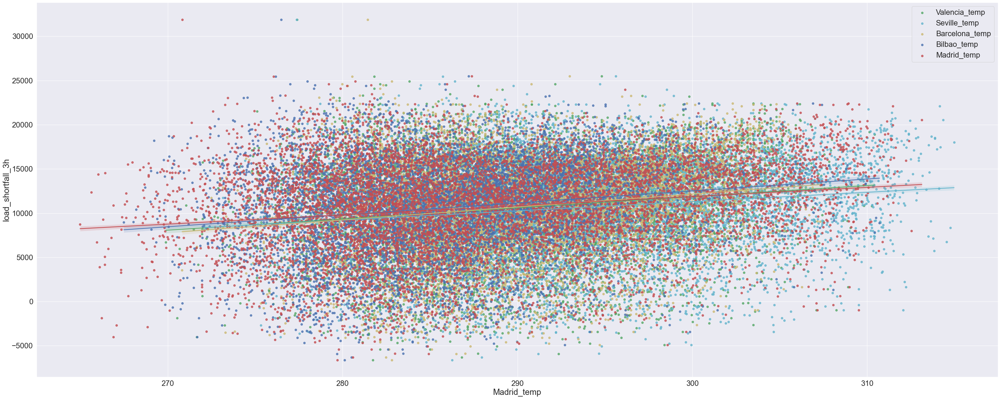

['Madrid_weather_id', 'Barcelona_weather_id', 'Seville_weather_id', 'Bilbao_weather_id', 'load_shortfall_3h']


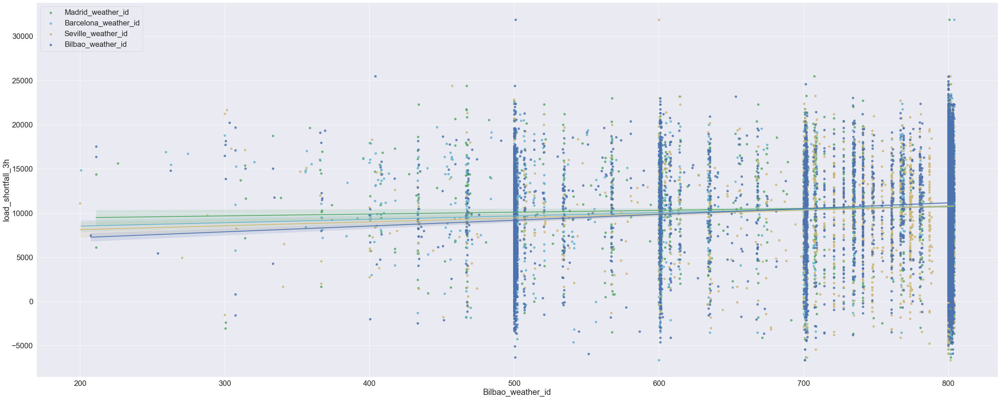

['Madrid_wind_speed', 'Valencia_wind_speed', 'Bilbao_wind_speed', 'Barcelona_wind_speed', 'Seville_wind_speed', 'load_shortfall_3h']


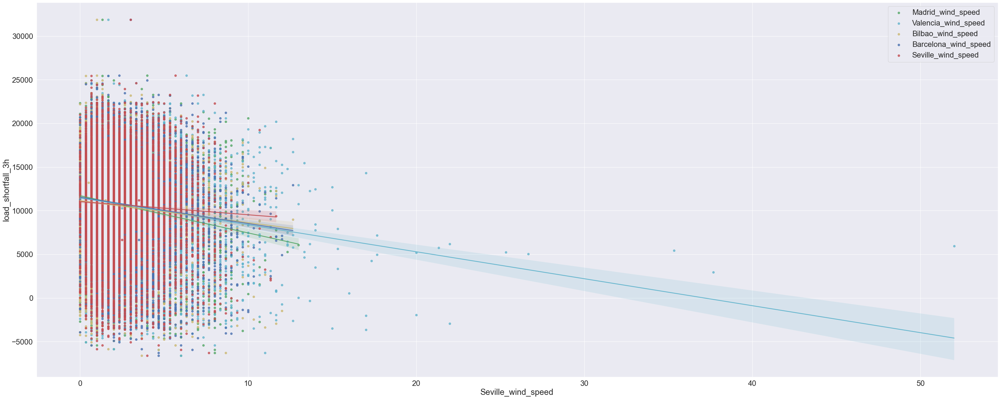

['Seville_temp_max', 'Valencia_temp_max', 'Barcelona_temp_max', 'Madrid_temp_max', 'Bilbao_temp_max', 'load_shortfall_3h']


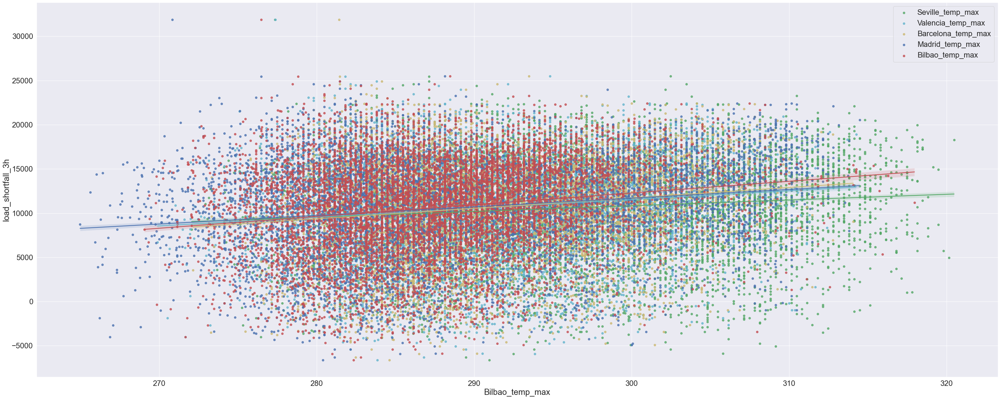

['Valencia_temp_min', 'Bilbao_temp_min', 'Barcelona_temp_min', 'Seville_temp_min', 'Madrid_temp_min', 'load_shortfall_3h']


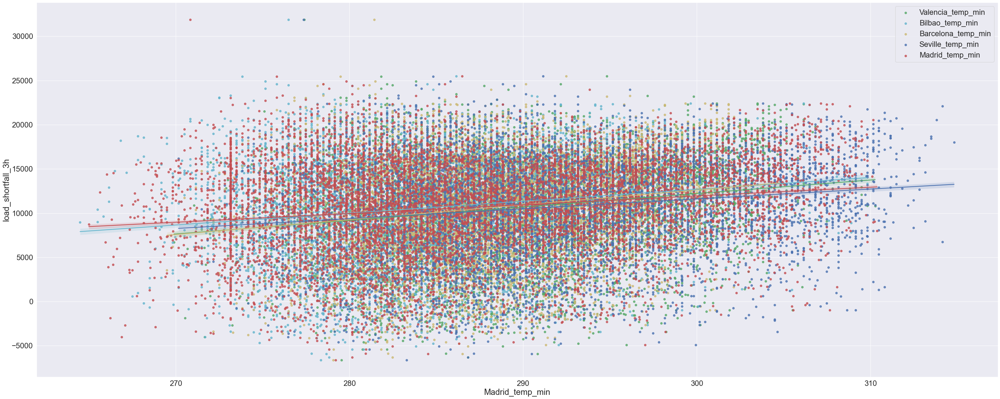

['load_shortfall_3h', 'load_shortfall_3h']


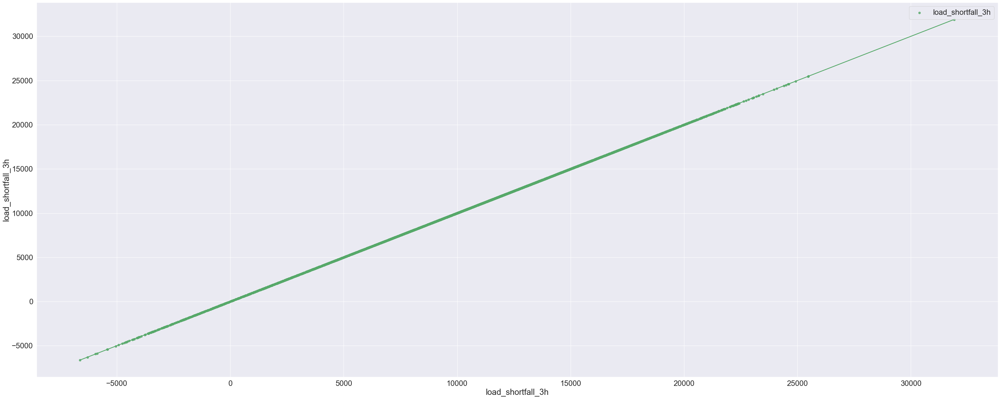

['Bilbao_snow_3h', 'Valencia_snow_3h', 'load_shortfall_3h']


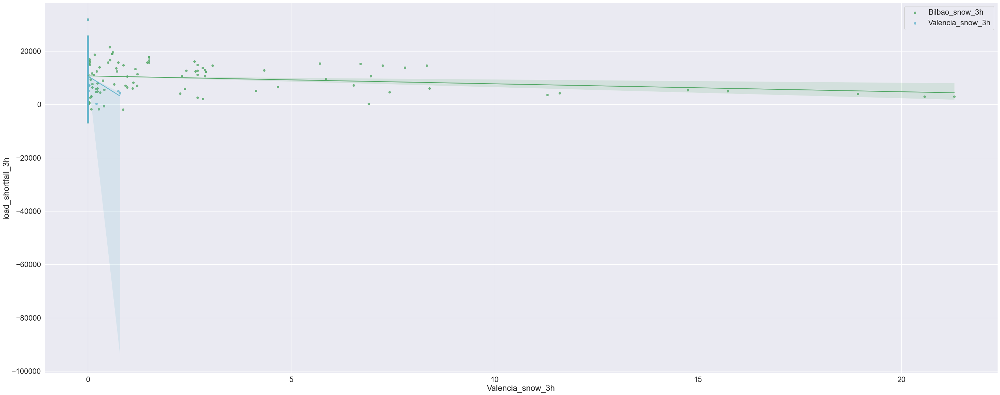

['Bilbao_rain_1h', 'Barcelona_rain_1h', 'Seville_rain_1h', 'Madrid_rain_1h', 'load_shortfall_3h']


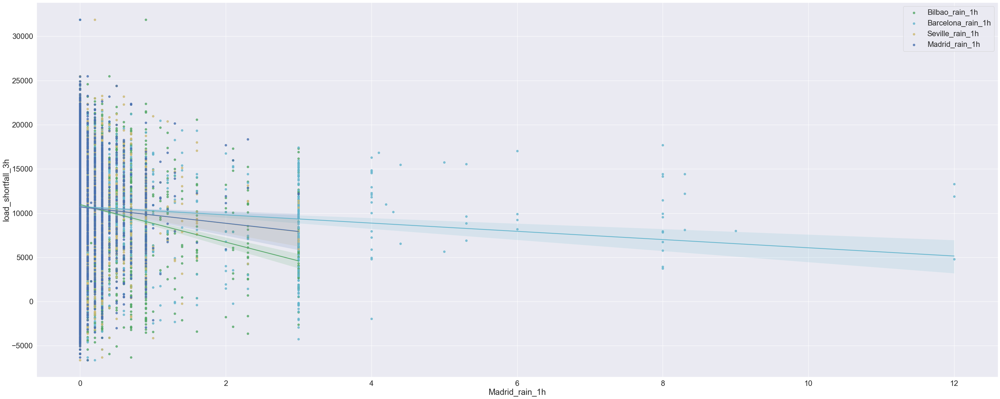

['Seville_humidity', 'Madrid_humidity', 'Valencia_humidity', 'load_shortfall_3h']


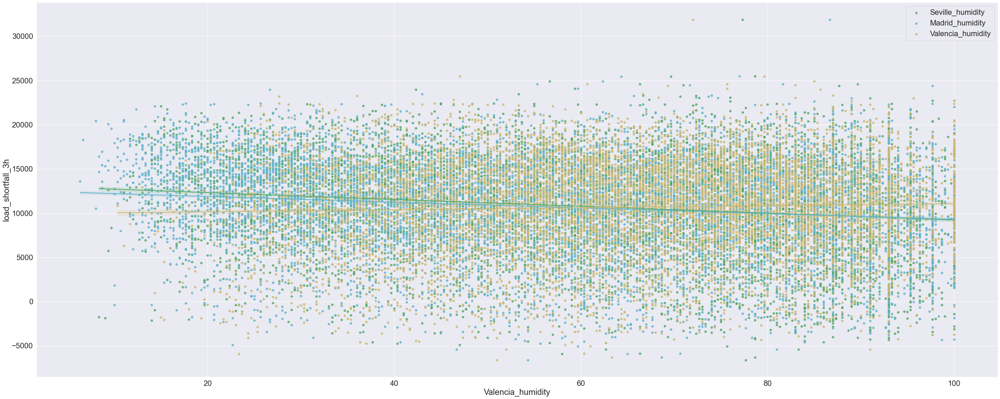

['Bilbao_clouds_all', 'Seville_clouds_all', 'Madrid_clouds_all', 'load_shortfall_3h']


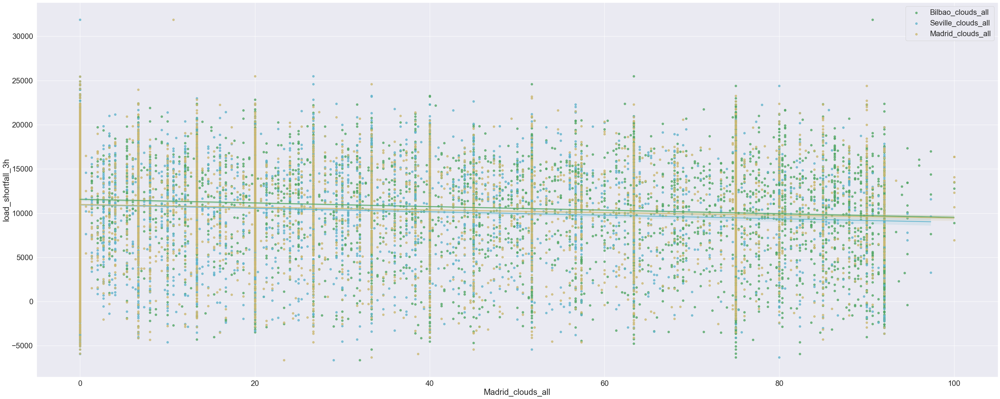

['Seville_rain_3h', 'Barcelona_rain_3h', 'load_shortfall_3h']


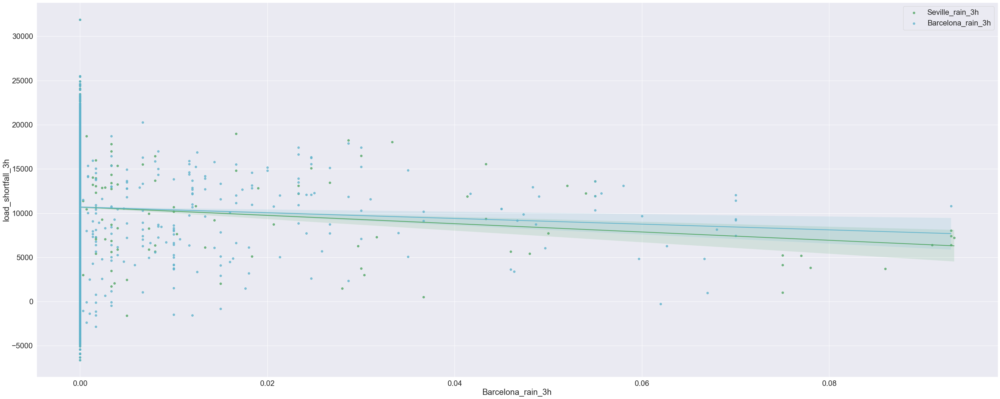

['Valencia_wind_deg', 'Bilbao_wind_deg', 'Barcelona_wind_deg', 'load_shortfall_3h']


UFuncTypeError: ufunc 'multiply' did not contain a loop with signature matching types (dtype('<U32'), dtype('<U32')) -> dtype('<U32')

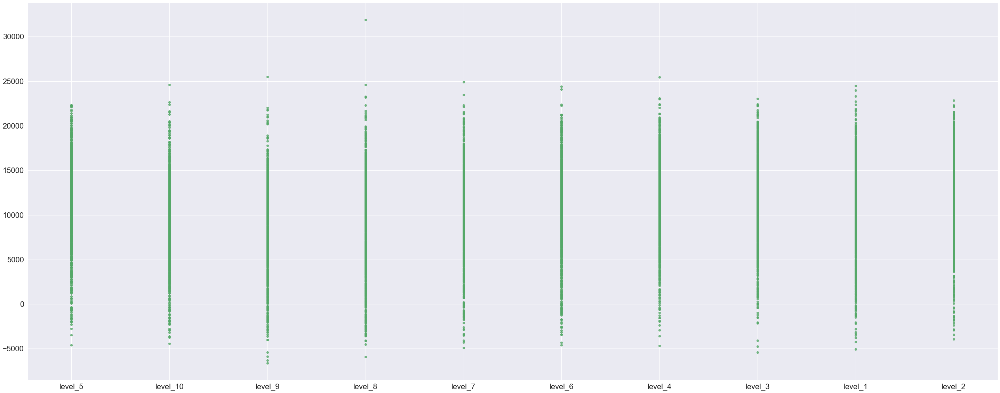

In [13]:
colors = ['g', 'c', 'y', 'b', 'r', 'k']

for i in feat_list:
    print(i)
    reg_plot_show(i)

In [ ]:
# Note that the other data not plotted seem to have some triats not plotable by regplot

In [ ]:
def box_plot_show(plotty):
    list_of_dirty_columns= ['time', 'Valencia_wind_degree', 'Seville_pressure'] #was trying to avoid columns that break our plot
    sns.set(font_scale=2) #use to adjust the size of the tics of the x and y axis
    fig_dims = (50, 20) #use to adjust the size of the plotted graph
    count= len(plotty)-1
    fig, axes = plt.subplots(1, count, figsize=fig_dims)

    #creating plots
    for i in range(len(plotty)-1):
        if plotty[i] not in list_of_dirty_columns:
            sns.scatterplot(x= plotty[i], y= 'load_shortfall_3h', data= df_train_start, color= colors[i], ax= axes[i])
        else:
            print(i)
    plt.legend()
    return plt.show()

In [ ]:
for i in feat_list:
    print(i)
    box_plot_show(i)

### 3. evaluate correlation

In [ ]:
# To create a list to allow for a similar feats grouped together 
feat_df_sorted_by_feat= pd.concat(feat_df, join= 'outer', axis= 1)
feat_df_sorted_by_feat.head()

In [ ]:
# I personally feel this is too much info so the important thing to look at will be the first column holding the name of features and the third column titled load_shortfall_3h
# This is becasue the dependent variable is load short fall and all predictors are listed in the column names, sepereated by a load_shortfall row
feat_df_sorted_by_feat.corr()

In [ ]:
sns.set(font_scale=2) #use to adjust the size of the tics of the x and y axis
fig_dims = (100, 100) #use to adjust the size of the plotted graph
fig, axes = plt.subplots(figsize=fig_dims)
dataplot = sns.heatmap(df_train_start.corr(), cmap="coolwarm", annot=True)
plt.show()

In [ ]:
a

### 4. have a look at feature distributions

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data engineering ⚡ |
| :--------------------------- |
| In this section you are required to: clean the dataset, and possibly create new features - as identified in the EDA phase. |

---

In [ ]:
# remove missing values/ features

In [ ]:
# create new features

In [ ]:
# engineer existing features

<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, you are required to create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

In [ ]:
# split data

In [ ]:
# create targets and features dataset

In [ ]:
# create one or more ML models

In [ ]:
# evaluate one or more ML models

<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

In [ ]:
# Compare model performance

In [ ]:
# Choose best model and motivate why it is the best choice

<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

In [ ]:
# discuss chosen methods logic